In [1]:
from src.utils import *

In [2]:
import scanpy as sc
import os
import re
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import loompy
import seaborn as sns
import pickle

import cell2location
import scvi
from PIL import Image

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFsx

import math
import mygene
mg = mygene.MyGeneInfo()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
Global seed set to 0


In [3]:
import torch
torch.cuda.is_available()

True

In [4]:
results_folder = './results/visium_test_L5_04102022_descr/'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}reference_signatures/'
run_name = f'{results_folder}cell2location_map/' 

os.makedirs(ref_run_name, exist_ok=True)

In [5]:
start_folder = '/media/Dropbox/MNM projects/Spatial transcriptomics project/Data analysis/Complete_ST_pipeline/bin/cell2loc/'
os.chdir(start_folder)
st_path = './data/'
image_path = '../../../Images_rev1/'
samples = ['ST3_D1', 'CN56_E1', 'ST3_C2', 'ST3_D2','ST3_E1','ST3_E2', 'CN56_E2', 
           'CN56_C2', 'CN56_D2']
# samples = ['ST3_D1', 'CN56_E1']
pickle_id = 'ST3_CN56'
sample_list = []

In [8]:
# Download and unzip spatial data
os.system('cd ./data && wget https://cell2location.cog.sanger.ac.uk/tutorial/mouse_brain_visium_wo_cloupe_data.zip')
os.system('cd ./data && unzip mouse_brain_visium_wo_cloupe_data.zip')

--2022-10-06 11:04:18--  https://cell2location.cog.sanger.ac.uk/tutorial/mouse_brain_visium_wo_cloupe_data.zip
Resolving cell2location.cog.sanger.ac.uk (cell2location.cog.sanger.ac.uk)... 193.62.203.61, 193.62.203.63, 193.62.203.62
Connecting to cell2location.cog.sanger.ac.uk (cell2location.cog.sanger.ac.uk)|193.62.203.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 770776022 (735M) [application/zip]
Saving to: ‘mouse_brain_visium_wo_cloupe_data.zip’

     0K .......... .......... .......... .......... ..........  0% 2.46M 4m59s
    50K .......... .......... .......... .......... ..........  0% 2.46M 4m59s
   100K .......... .......... .......... .......... ..........  0%  116M 3m21s
   150K .......... .......... .......... .......... ..........  0% 2.49M 3m45s
   200K .......... .......... .......... .......... ..........  0% 63.2M 3m2s
   250K .......... .......... .......... .......... ..........  0% 80.9M 2m33s
   300K .......... .......... .......... .

 12350K .......... .......... .......... .......... ..........  1%  145M 13s
 12400K .......... .......... .......... .......... ..........  1%  126M 13s
 12450K .......... .......... .......... .......... ..........  1% 95.1M 13s
 12500K .......... .......... .......... .......... ..........  1%  126M 13s
 12550K .......... .......... .......... .......... ..........  1%  117M 13s
 12600K .......... .......... .......... .......... ..........  1%  125M 13s
 12650K .......... .......... .......... .......... ..........  1% 95.7M 13s
 12700K .......... .......... .......... .......... ..........  1%  125M 13s
 12750K .......... .......... .......... .......... ..........  1%  100M 13s
 12800K .......... .......... .......... .......... ..........  1%  125M 13s
 12850K .......... .......... .......... .......... ..........  1% 95.2M 13s
 12900K .......... .......... .......... .......... ..........  1%  122M 13s
 12950K .......... .......... .......... .......... ..........  1%  121M 13s

 32300K .......... .......... .......... .......... ..........  4% 99.7M 9s
 32350K .......... .......... .......... .......... ..........  4%  110M 9s
 32400K .......... .......... .......... .......... ..........  4% 93.4M 9s
 32450K .......... .......... .......... .......... ..........  4% 98.2M 9s
 32500K .......... .......... .......... .......... ..........  4% 96.5M 9s
 32550K .......... .......... .......... .......... ..........  4% 86.0M 9s
 32600K .......... .......... .......... .......... ..........  4%  164M 9s
 32650K .......... .......... .......... .......... ..........  4%  156M 9s
 32700K .......... .......... .......... .......... ..........  4%  100M 9s
 32750K .......... .......... .......... .......... ..........  4% 52.7M 9s
 32800K .......... .......... .......... .......... ..........  4% 96.3M 9s
 32850K .......... .......... .......... .......... ..........  4%  111M 9s
 32900K .......... .......... .......... .......... ..........  4%  106M 9s
 32950K ....

 55200K .......... .......... .......... .......... ..........  7%  120M 8s
 55250K .......... .......... .......... .......... ..........  7%  127M 8s
 55300K .......... .......... .......... .......... ..........  7% 61.2M 8s
 55350K .......... .......... .......... .......... ..........  7%  142M 8s
 55400K .......... .......... .......... .......... ..........  7%  140M 8s
 55450K .......... .......... .......... .......... ..........  7%  143M 8s
 55500K .......... .......... .......... .......... ..........  7%  129M 8s
 55550K .......... .......... .......... .......... ..........  7% 97.0M 8s
 55600K .......... .......... .......... .......... ..........  7%  129M 8s
 55650K .......... .......... .......... .......... ..........  7%  127M 8s
 55700K .......... .......... .......... .......... ..........  7% 93.5M 8s
 55750K .......... .......... .......... .......... ..........  7%  116M 8s
 55800K .......... .......... .......... .......... ..........  7%  132M 8s
 55850K ....

 78250K .......... .......... .......... .......... .......... 10% 92.2M 7s
 78300K .......... .......... .......... .......... .......... 10%  125M 7s
 78350K .......... .......... .......... .......... .......... 10%  103M 7s
 78400K .......... .......... .......... .......... .......... 10%  128M 7s
 78450K .......... .......... .......... .......... .......... 10% 94.2M 7s
 78500K .......... .......... .......... .......... .......... 10%  126M 7s
 78550K .......... .......... .......... .......... .......... 10%  116M 7s
 78600K .......... .......... .......... .......... .......... 10%  120M 7s
 78650K .......... .......... .......... .......... .......... 10% 95.8M 7s
 78700K .......... .......... .......... .......... .......... 10%  126M 7s
 78750K .......... .......... .......... .......... .......... 10%  104M 7s
 78800K .......... .......... .......... .......... .......... 10%  123M 7s
 78850K .......... .......... .......... .......... .......... 10% 61.8M 7s
 78900K ....

101250K .......... .......... .......... .......... .......... 13%  118M 7s
101300K .......... .......... .......... .......... .......... 13%  110M 7s
101350K .......... .......... .......... .......... .......... 13% 65.8M 7s
101400K .......... .......... .......... .......... .......... 13%  156M 7s
101450K .......... .......... .......... .......... .......... 13%  160M 7s
101500K .......... .......... .......... .......... .......... 13%  138M 7s
101550K .......... .......... .......... .......... .......... 13% 94.5M 7s
101600K .......... .......... .......... .......... .......... 13%  118M 7s
101650K .......... .......... .......... .......... .......... 13%  120M 7s
101700K .......... .......... .......... .......... .......... 13%  117M 7s
101750K .......... .......... .......... .......... .......... 13%  103M 7s
101800K .......... .......... .......... .......... .......... 13%  116M 7s
101850K .......... .......... .......... .......... .......... 13%  121M 7s
101900K ....

124300K .......... .......... .......... .......... .......... 16%  128M 6s
124350K .......... .......... .......... .......... .......... 16% 99.5M 6s
124400K .......... .......... .......... .......... .......... 16%  126M 6s
124450K .......... .......... .......... .......... .......... 16% 89.4M 6s
124500K .......... .......... .......... .......... .......... 16%  136M 6s
124550K .......... .......... .......... .......... .......... 16%  116M 6s
124600K .......... .......... .......... .......... .......... 16%  129M 6s
124650K .......... .......... .......... .......... .......... 16% 93.1M 6s
124700K .......... .......... .......... .......... .......... 16%  130M 6s
124750K .......... .......... .......... .......... .......... 16% 98.2M 6s
124800K .......... .......... .......... .......... .......... 16%  124M 6s
124850K .......... .......... .......... .......... .......... 16% 92.5M 6s
124900K .......... .......... .......... .......... .......... 16% 86.9M 6s
124950K ....

147300K .......... .......... .......... .......... .......... 19%  122M 6s
147350K .......... .......... .......... .......... .......... 19% 92.7M 6s
147400K .......... .......... .......... .......... .......... 19%  123M 6s
147450K .......... .......... .......... .......... .......... 19% 80.7M 6s
147500K .......... .......... .......... .......... .......... 19%  235M 6s
147550K .......... .......... .......... .......... .......... 19% 85.9M 6s
147600K .......... .......... .......... .......... .......... 19%  124M 6s
147650K .......... .......... .......... .......... .......... 19%  122M 6s
147700K .......... .......... .......... .......... .......... 19%  130M 6s
147750K .......... .......... .......... .......... .......... 19% 90.2M 6s
147800K .......... .......... .......... .......... .......... 19%  123M 6s
147850K .......... .......... .......... .......... .......... 19%  128M 6s
147900K .......... .......... .......... .......... .......... 19%  125M 6s
147950K ....

170350K .......... .......... .......... .......... .......... 22%  100M 6s
170400K .......... .......... .......... .......... .......... 22% 95.3M 6s
170450K .......... .......... .......... .......... .......... 22%  102M 6s
170500K .......... .......... .......... .......... .......... 22%  155M 6s
170550K .......... .......... .......... .......... .......... 22%  123M 6s
170600K .......... .......... .......... .......... .......... 22% 93.2M 6s
170650K .......... .......... .......... .......... .......... 22%  129M 6s
170700K .......... .......... .......... .......... .......... 22%  124M 6s
170750K .......... .......... .......... .......... .......... 22% 99.7M 6s
170800K .......... .......... .......... .......... .......... 22% 94.9M 6s
170850K .......... .......... .......... .......... .......... 22%  128M 6s
170900K .......... .......... .......... .......... .......... 22%  124M 6s
170950K .......... .......... .......... .......... .......... 22%  119M 6s
171000K ....

193400K .......... .......... .......... .......... .......... 25%  126M 5s
193450K .......... .......... .......... .......... .......... 25%  122M 5s
193500K .......... .......... .......... .......... .......... 25% 47.5M 5s
193550K .......... .......... .......... .......... .......... 25%  102M 5s
193600K .......... .......... .......... .......... .......... 25%  154M 5s
193650K .......... .......... .......... .......... .......... 25%  107M 5s
193700K .......... .......... .......... .......... .......... 25%  124M 5s
193750K .......... .......... .......... .......... .......... 25%  207M 5s
193800K .......... .......... .......... .......... .......... 25%  241M 5s
193850K .......... .......... .......... .......... .......... 25%  137M 5s
193900K .......... .......... .......... .......... .......... 25% 95.9M 5s
193950K .......... .......... .......... .......... .......... 25%  100M 5s
194000K .......... .......... .......... .......... .......... 25%  126M 5s
194050K ....

216400K .......... .......... .......... .......... .......... 28%  126M 5s
216450K .......... .......... .......... .......... .......... 28%  127M 5s
216500K .......... .......... .......... .......... .......... 28% 94.5M 5s
216550K .......... .......... .......... .......... .......... 28%  115M 5s
216600K .......... .......... .......... .......... .......... 28%  126M 5s
216650K .......... .......... .......... .......... .......... 28%  126M 5s
216700K .......... .......... .......... .......... .......... 28% 96.9M 5s
216750K .......... .......... .......... .......... .......... 28% 99.4M 5s
216800K .......... .......... .......... .......... .......... 28%  124M 5s
216850K .......... .......... .......... .......... .......... 28%  127M 5s
216900K .......... .......... .......... .......... .......... 28% 94.8M 5s
216950K .......... .......... .......... .......... .......... 28%  115M 5s
217000K .......... .......... .......... .......... .......... 28%  127M 5s
217050K ....

239400K .......... .......... .......... .......... .......... 31% 95.2M 5s
239450K .......... .......... .......... .......... .......... 31%  125M 5s
239500K .......... .......... .......... .......... .......... 31%  127M 5s
239550K .......... .......... .......... .......... .......... 31% 99.3M 5s
239600K .......... .......... .......... .......... .......... 31% 90.4M 5s
239650K .......... .......... .......... .......... .......... 31%  135M 5s
239700K .......... .......... .......... .......... .......... 31%  126M 5s
239750K .......... .......... .......... .......... .......... 31%  118M 5s
239800K .......... .......... .......... .......... .......... 31% 95.1M 5s
239850K .......... .......... .......... .......... .......... 31%  124M 5s
239900K .......... .......... .......... .......... .......... 31%  128M 5s
239950K .......... .......... .......... .......... .......... 31% 99.8M 5s
240000K .......... .......... .......... .......... .......... 31% 94.8M 5s
240050K ....

262400K .......... .......... .......... .......... .......... 34%  125M 5s
262450K .......... .......... .......... .......... .......... 34%  124M 5s
262500K .......... .......... .......... .......... .......... 34%  127M 5s
262550K .......... .......... .......... .......... .......... 34% 89.9M 5s
262600K .......... .......... .......... .......... .......... 34%  125M 5s
262650K .......... .......... .......... .......... .......... 34%  125M 5s
262700K .......... .......... .......... .......... .......... 34%  128M 5s
262750K .......... .......... .......... .......... .......... 34% 79.9M 5s
262800K .......... .......... .......... .......... .......... 34%  124M 5s
262850K .......... .......... .......... .......... .......... 34%  126M 5s
262900K .......... .......... .......... .......... .......... 34%  126M 5s
262950K .......... .......... .......... .......... .......... 34% 90.6M 5s
263000K .......... .......... .......... .......... .......... 34%  125M 5s
263050K ....

285150K .......... .......... .......... .......... .......... 37% 79.4M 4s
285200K .......... .......... .......... .......... .......... 37%  126M 4s
285250K .......... .......... .......... .......... .......... 37%  126M 4s
285300K .......... .......... .......... .......... .......... 37%  126M 4s
285350K .......... .......... .......... .......... .......... 37% 89.9M 4s
285400K .......... .......... .......... .......... .......... 37%  126M 4s
285450K .......... .......... .......... .......... .......... 37%  126M 4s
285500K .......... .......... .......... .......... .......... 37%  124M 4s
285550K .......... .......... .......... .......... .......... 37% 80.4M 4s
285600K .......... .......... .......... .......... .......... 37%  126M 4s
285650K .......... .......... .......... .......... .......... 37% 1.17M 4s
285700K .......... .......... .......... .......... .......... 37% 53.2M 4s
285750K .......... .......... .......... .......... .......... 37%  184M 4s
285800K ....

303450K .......... .......... .......... .......... .......... 40%  126M 4s
303500K .......... .......... .......... .......... .......... 40%  124M 4s
303550K .......... .......... .......... .......... .......... 40%  127M 4s
303600K .......... .......... .......... .......... .......... 40% 78.8M 4s
303650K .......... .......... .......... .......... .......... 40%  128M 4s
303700K .......... .......... .......... .......... .......... 40%  124M 4s
303750K .......... .......... .......... .......... .......... 40%  127M 4s
303800K .......... .......... .......... .......... .......... 40% 84.6M 4s
303850K .......... .......... .......... .......... .......... 40%  130M 4s
303900K .......... .......... .......... .......... .......... 40%  124M 4s
303950K .......... .......... .......... .......... .......... 40%  129M 4s
304000K .......... .......... .......... .......... .......... 40% 80.0M 4s
304050K .......... .......... .......... .......... .......... 40%  125M 4s
304100K ....

326450K .......... .......... .......... .......... .......... 43%  124M 4s
326500K .......... .......... .......... .......... .......... 43% 97.0M 4s
326550K .......... .......... .......... .......... .......... 43%  124M 4s
326600K .......... .......... .......... .......... .......... 43%  118M 4s
326650K .......... .......... .......... .......... .......... 43% 82.9M 4s
326700K .......... .......... .......... .......... .......... 43%  144M 4s
326750K .......... .......... .......... .......... .......... 43% 86.5M 4s
326800K .......... .......... .......... .......... .......... 43% 68.2M 4s
326850K .......... .......... .......... .......... .......... 43%  138M 4s
326900K .......... .......... .......... .......... .......... 43%  150M 4s
326950K .......... .......... .......... .......... .......... 43%  190M 4s
327000K .......... .......... .......... .......... .......... 43%  143M 4s
327050K .......... .......... .......... .......... .......... 43%  126M 4s
327100K ....

334150K .......... .......... .......... .......... .......... 44%  126M 4s
334200K .......... .......... .......... .......... .......... 44%  119M 4s
334250K .......... .......... .......... .......... .......... 44% 93.8M 4s
334300K .......... .......... .......... .......... .......... 44%  127M 4s
334350K .......... .......... .......... .......... .......... 44%  126M 4s
334400K .......... .......... .......... .......... .......... 44% 79.6M 4s
334450K .......... .......... .......... .......... .......... 44%  125M 4s
334500K .......... .......... .......... .......... .......... 44%  126M 4s
334550K .......... .......... .......... .......... .......... 44%  127M 4s
334600K .......... .......... .......... .......... .......... 44% 89.9M 4s
334650K .......... .......... .......... .......... .......... 44%  124M 4s
334700K .......... .......... .......... .......... .......... 44%  126M 4s
334750K .......... .......... .......... .......... .......... 44%  126M 4s
334800K ....

357150K .......... .......... .......... .......... .......... 47%  126M 4s
357200K .......... .......... .......... .......... .......... 47%  100M 4s
357250K .......... .......... .......... .......... .......... 47% 95.1M 4s
357300K .......... .......... .......... .......... .......... 47%  127M 4s
357350K .......... .......... .......... .......... .......... 47% 86.4M 4s
357400K .......... .......... .......... .......... .......... 47%  195M 4s
357450K .......... .......... .......... .......... .......... 47% 97.2M 4s
357500K .......... .......... .......... .......... .......... 47%  125M 4s
357550K .......... .......... .......... .......... .......... 47%  127M 4s
357600K .......... .......... .......... .......... .......... 47% 99.2M 4s
357650K .......... .......... .......... .......... .......... 47% 94.7M 4s
357700K .......... .......... .......... .......... .......... 47%  126M 4s
357750K .......... .......... .......... .......... .......... 47%  127M 4s
357800K ....

379950K .......... .......... .......... .......... .......... 50%  134M 4s
380000K .......... .......... .......... .......... .......... 50%  115M 4s
380050K .......... .......... .......... .......... .......... 50%  119M 4s
380100K .......... .......... .......... .......... .......... 50%  129M 4s
380150K .......... .......... .......... .......... .......... 50%  132M 4s
380200K .......... .......... .......... .......... .......... 50%  124M 4s
380250K .......... .......... .......... .......... .......... 50%  138M 4s
380300K .......... .......... .......... .......... .......... 50%  207M 4s
380350K .......... .......... .......... .......... .......... 50%  131M 4s
380400K .......... .......... .......... .......... .......... 50% 96.6M 4s
380450K .......... .......... .......... .......... .......... 50%  144M 4s
380500K .......... .......... .......... .......... .......... 50%  138M 4s
380550K .......... .......... .......... .......... .......... 50%  139M 4s
380600K ....

403200K .......... .......... .......... .......... .......... 53% 78.5M 3s
403250K .......... .......... .......... .......... .......... 53%  128M 3s
403300K .......... .......... .......... .......... .......... 53%  122M 3s
403350K .......... .......... .......... .......... .......... 53%  129M 3s
403400K .......... .......... .......... .......... .......... 53% 91.1M 3s
403450K .......... .......... .......... .......... .......... 53%  127M 3s
403500K .......... .......... .......... .......... .......... 53%  123M 3s
403550K .......... .......... .......... .......... .......... 53%  126M 3s
403600K .......... .......... .......... .......... .......... 53% 80.7M 3s
403650K .......... .......... .......... .......... .......... 53%  124M 3s
403700K .......... .......... .......... .......... .......... 53%  126M 3s
403750K .......... .......... .......... .......... .......... 53%  125M 3s
403800K .......... .......... .......... .......... .......... 53% 90.5M 3s
403850K ....

420600K .......... .......... .......... .......... .......... 55%  112M 3s
420650K .......... .......... .......... .......... .......... 55%  129M 3s
420700K .......... .......... .......... .......... .......... 55%  121M 3s
420750K .......... .......... .......... .......... .......... 55% 96.4M 3s
420800K .......... .......... .......... .......... .......... 55%  104M 3s
420850K .......... .......... .......... .......... .......... 55% 84.8M 3s
420900K .......... .......... .......... .......... .......... 55%  155M 3s
420950K .......... .......... .......... .......... .......... 55%  127M 3s
421000K .......... .......... .......... .......... .......... 55%  116M 3s
421050K .......... .......... .......... .......... .......... 55%  127M 3s
421100K .......... .......... .......... .......... .......... 55%  125M 3s
421150K .......... .......... .......... .......... .......... 55% 95.4M 3s
421200K .......... .......... .......... .......... .......... 55% 98.6M 3s
421250K ....

443600K .......... .......... .......... .......... .......... 58% 97.4M 3s
443650K .......... .......... .......... .......... .......... 58%  118M 3s
443700K .......... .......... .......... .......... .......... 58%  113M 3s
443750K .......... .......... .......... .......... .......... 58%  115M 3s
443800K .......... .......... .......... .......... .......... 58%  103M 3s
443850K .......... .......... .......... .......... .......... 58%  123M 3s
443900K .......... .......... .......... .......... .......... 58%  118M 3s
443950K .......... .......... .......... .......... .......... 58%  119M 3s
444000K .......... .......... .......... .......... .......... 58% 94.8M 3s
444050K .......... .......... .......... .......... .......... 59%  117M 3s
444100K .......... .......... .......... .......... .......... 59%  114M 3s
444150K .......... .......... .......... .......... .......... 59%  115M 3s
444200K .......... .......... .......... .......... .......... 59%  109M 3s
444250K ....

466150K .......... .......... .......... .......... .......... 61%  126M 3s
466200K .......... .......... .......... .......... .......... 61%  115M 3s
466250K .......... .......... .......... .......... .......... 61%  127M 3s
466300K .......... .......... .......... .......... .......... 61% 95.6M 3s
466350K .......... .......... .......... .......... .......... 61%  125M 3s
466400K .......... .......... .......... .......... .......... 61%  100M 3s
466450K .......... .......... .......... .......... .......... 61%  124M 3s
466500K .......... .......... .......... .......... .......... 61% 96.3M 3s
466550K .......... .......... .......... .......... .......... 61%  124M 3s
466600K .......... .......... .......... .......... .......... 61%  118M 3s
466650K .......... .......... .......... .......... .......... 62%  127M 3s
466700K .......... .......... .......... .......... .......... 62% 95.0M 3s
466750K .......... .......... .......... .......... .......... 62%  125M 3s
466800K ....

489200K .......... .......... .......... .......... .......... 64%  102M 2s
489250K .......... .......... .......... .......... .......... 65% 94.4M 2s
489300K .......... .......... .......... .......... .......... 65%  127M 2s
489350K .......... .......... .......... .......... .......... 65%  121M 2s
489400K .......... .......... .......... .......... .......... 65%  117M 2s
489450K .......... .......... .......... .......... .......... 65% 81.1M 2s
489500K .......... .......... .......... .......... .......... 65%  171M 2s
489550K .......... .......... .......... .......... .......... 65%  126M 2s
489600K .......... .......... .......... .......... .......... 65%  100M 2s
489650K .......... .......... .......... .......... .......... 65% 95.0M 2s
489700K .......... .......... .......... .......... .......... 65%  124M 2s
489750K .......... .......... .......... .......... .......... 65%  127M 2s
489800K .......... .......... .......... .......... .......... 65%  116M 2s
489850K ....

512200K .......... .......... .......... .......... .......... 68%  120M 2s
512250K .......... .......... .......... .......... .......... 68% 94.9M 2s
512300K .......... .......... .......... .......... .......... 68%  126M 2s
512350K .......... .......... .......... .......... .......... 68%  125M 2s
512400K .......... .......... .......... .......... .......... 68%  100M 2s
512450K .......... .......... .......... .......... .......... 68% 95.7M 2s
512500K .......... .......... .......... .......... .......... 68%  126M 2s
512550K .......... .......... .......... .......... .......... 68%  126M 2s
512600K .......... .......... .......... .......... .......... 68%  116M 2s
512650K .......... .......... .......... .......... .......... 68% 95.3M 2s
512700K .......... .......... .......... .......... .......... 68%  126M 2s
512750K .......... .......... .......... .......... .......... 68%  127M 2s
512800K .......... .......... .......... .......... .......... 68%  100M 2s
512850K ....

535200K .......... .......... .......... .......... .......... 71%  101M 2s
535250K .......... .......... .......... .......... .......... 71%  125M 2s
535300K .......... .......... .......... .......... .......... 71%  127M 2s
535350K .......... .......... .......... .......... .......... 71% 94.8M 2s
535400K .......... .......... .......... .......... .......... 71%  117M 2s
535450K .......... .......... .......... .......... .......... 71%  126M 2s
535500K .......... .......... .......... .......... .......... 71%  126M 2s
535550K .......... .......... .......... .......... .......... 71% 90.5M 2s
535600K .......... .......... .......... .......... .......... 71%  106M 2s
535650K .......... .......... .......... .......... .......... 71%  126M 2s
535700K .......... .......... .......... .......... .......... 71%  126M 2s
535750K .......... .......... .......... .......... .......... 71% 95.0M 2s
535800K .......... .......... .......... .......... .......... 71%  116M 2s
535850K ....

557950K .......... .......... .......... .......... .......... 74%  121M 2s
558000K .......... .......... .......... .......... .......... 74%  129M 2s
558050K .......... .......... .......... .......... .......... 74% 82.4M 2s
558100K .......... .......... .......... .......... .......... 74%  105M 2s
558150K .......... .......... .......... .......... .......... 74% 92.5M 2s
558200K .......... .......... .......... .......... .......... 74% 83.3M 2s
558250K .......... .......... .......... .......... .......... 74% 97.0M 2s
558300K .......... .......... .......... .......... .......... 74% 99.4M 2s
558350K .......... .......... .......... .......... .......... 74% 99.0M 2s
558400K .......... .......... .......... .......... .......... 74% 81.4M 2s
558450K .......... .......... .......... .......... .......... 74% 95.4M 2s
558500K .......... .......... .......... .......... .......... 74% 93.5M 2s
558550K .......... .......... .......... .......... .......... 74% 93.6M 2s
558600K ....

580850K .......... .......... .......... .......... .......... 77% 77.7M 2s
580900K .......... .......... .......... .......... .......... 77%  132M 2s
580950K .......... .......... .......... .......... .......... 77%  123M 2s
581000K .......... .......... .......... .......... .......... 77% 87.9M 2s
581050K .......... .......... .......... .......... .......... 77% 95.0M 2s
581100K .......... .......... .......... .......... .......... 77% 97.6M 2s
581150K .......... .......... .......... .......... .......... 77% 99.2M 2s
581200K .......... .......... .......... .......... .......... 77% 85.3M 2s
581250K .......... .......... .......... .......... .......... 77% 99.2M 2s
581300K .......... .......... .......... .......... .......... 77% 95.3M 2s
581350K .......... .......... .......... .......... .......... 77% 98.2M 2s
581400K .......... .......... .......... .......... .......... 77% 84.0M 2s
581450K .......... .......... .......... .......... .......... 77% 99.8M 2s
581500K ....

604350K .......... .......... .......... .......... .......... 80%  118M 1s
604400K .......... .......... .......... .......... .......... 80% 91.5M 1s
604450K .......... .......... .......... .......... .......... 80%  116M 1s
604500K .......... .......... .......... .......... .......... 80%  111M 1s
604550K .......... .......... .......... .......... .......... 80%  136M 1s
604600K .......... .......... .......... .......... .......... 80% 92.1M 1s
604650K .......... .......... .......... .......... .......... 80%  125M 1s
604700K .......... .......... .......... .......... .......... 80%  125M 1s
604750K .......... .......... .......... .......... .......... 80%  128M 1s
604800K .......... .......... .......... .......... .......... 80% 78.7M 1s
604850K .......... .......... .......... .......... .......... 80%  126M 1s
604900K .......... .......... .......... .......... .......... 80%  127M 1s
604950K .......... .......... .......... .......... .......... 80% 95.5M 1s
605000K ....

627400K .......... .......... .......... .......... .......... 83%  106M 1s
627450K .......... .......... .......... .......... .......... 83%  117M 1s
627500K .......... .......... .......... .......... .......... 83%  113M 1s
627550K .......... .......... .......... .......... .......... 83%  118M 1s
627600K .......... .......... .......... .......... .......... 83% 94.5M 1s
627650K .......... .......... .......... .......... .......... 83%  118M 1s
627700K .......... .......... .......... .......... .......... 83% 81.1M 1s
627750K .......... .......... .......... .......... .......... 83%  170M 1s
627800K .......... .......... .......... .......... .......... 83%  101M 1s
627850K .......... .......... .......... .......... .......... 83%  138M 1s
627900K .......... .......... .......... .......... .......... 83%  120M 1s
627950K .......... .......... .......... .......... .......... 83%  116M 1s
628000K .......... .......... .......... .......... .......... 83% 93.8M 1s
628050K ....

650450K .......... .......... .......... .......... .......... 86%  133M 1s
650500K .......... .......... .......... .......... .......... 86%  125M 1s
650550K .......... .......... .......... .......... .......... 86% 96.4M 1s
650600K .......... .......... .......... .......... .......... 86%  116M 1s
650650K .......... .......... .......... .......... .......... 86%  126M 1s
650700K .......... .......... .......... .......... .......... 86%  125M 1s
650750K .......... .......... .......... .......... .......... 86% 91.6M 1s
650800K .......... .......... .......... .......... .......... 86%  104M 1s
650850K .......... .......... .......... .......... .......... 86%  115M 1s
650900K .......... .......... .......... .......... .......... 86%  123M 1s
650950K .......... .......... .......... .......... .......... 86%  100M 1s
651000K .......... .......... .......... .......... .......... 86%  109M 1s
651050K .......... .......... .......... .......... .......... 86%  126M 1s
651100K ....

673500K .......... .......... .......... .......... .......... 89%  131M 1s
673550K .......... .......... .......... .......... .......... 89% 95.0M 1s
673600K .......... .......... .......... .......... .......... 89% 99.7M 1s
673650K .......... .......... .......... .......... .......... 89%  125M 1s
673700K .......... .......... .......... .......... .......... 89%  127M 1s
673750K .......... .......... .......... .......... .......... 89% 95.9M 1s
673800K .......... .......... .......... .......... .......... 89% 75.2M 1s
673850K .......... .......... .......... .......... .......... 89%  156M 1s
673900K .......... .......... .......... .......... .......... 89%  125M 1s
673950K .......... .......... .......... .......... .......... 89%  130M 1s
674000K .......... .......... .......... .......... .......... 89%  102M 1s
674050K .......... .......... .......... .......... .......... 89%  116M 1s
674100K .......... .......... .......... .......... .......... 89%  125M 1s
674150K ....

696500K .......... .......... .......... .......... .......... 92% 94.6M 1s
696550K .......... .......... .......... .......... .......... 92%  125M 1s
696600K .......... .......... .......... .......... .......... 92%  118M 1s
696650K .......... .......... .......... .......... .......... 92%  127M 1s
696700K .......... .......... .......... .......... .......... 92% 95.2M 1s
696750K .......... .......... .......... .......... .......... 92%  124M 1s
696800K .......... .......... .......... .......... .......... 92%  101M 1s
696850K .......... .......... .......... .......... .......... 92% 90.3M 1s
696900K .......... .......... .......... .......... .......... 92%  136M 1s
696950K .......... .......... .......... .......... .......... 92%  124M 1s
697000K .......... .......... .......... .......... .......... 92%  115M 1s
697050K .......... .......... .......... .......... .......... 92%  128M 1s
697100K .......... .......... .......... .......... .......... 92% 94.3M 1s
697150K ....

719550K .......... .......... .......... .......... .......... 95%  123M 0s
719600K .......... .......... .......... .......... .......... 95%  102M 0s
719650K .......... .......... .......... .......... .......... 95% 95.6M 0s
719700K .......... .......... .......... .......... .......... 95%  125M 0s
719750K .......... .......... .......... .......... .......... 95%  126M 0s
719800K .......... .......... .......... .......... .......... 95%  116M 0s
719850K .......... .......... .......... .......... .......... 95% 79.3M 0s
719900K .......... .......... .......... .......... .......... 95%  169M 0s
719950K .......... .......... .......... .......... .......... 95%  126M 0s
720000K .......... .......... .......... .......... .......... 95% 99.0M 0s
720050K .......... .......... .......... .......... .......... 95% 97.9M 0s
720100K .......... .......... .......... .......... .......... 95%  120M 0s
720150K .......... .......... .......... .......... .......... 95%  130M 0s
720200K ....

742550K .......... .......... .......... .......... .......... 98%  126M 0s
742600K .......... .......... .......... .......... .......... 98% 89.0M 0s
742650K .......... .......... .......... .......... .......... 98%  127M 0s
742700K .......... .......... .......... .......... .......... 98%  127M 0s
742750K .......... .......... .......... .......... .......... 98%  126M 0s
742800K .......... .......... .......... .......... .......... 98% 80.2M 0s
742850K .......... .......... .......... .......... .......... 98%  123M 0s
742900K .......... .......... .......... .......... .......... 98%  126M 0s
742950K .......... .......... .......... .......... .......... 98%  125M 0s
743000K .......... .......... .......... .......... .......... 98%  119M 0s
743050K .......... .......... .......... .......... .......... 98% 93.6M 0s
743100K .......... .......... .......... .......... .......... 98%  128M 0s
743150K .......... .......... .......... .......... .......... 98%  125M 0s
743200K ....

Archive:  mouse_brain_visium_wo_cloupe_data.zip
   creating: mouse_brain_visium_wo_cloupe_data/
   creating: mouse_brain_visium_wo_cloupe_data/rawdata/
   creating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/filtered_feature_bc_matrix.h5  
   creating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/spatial/
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/spatial/detected_tissue_image.jpg  
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/spatial/scalefactors_json.json  
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/spatial/tissue_hires_image.png  
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/spatial/tissue_positions_list.csv  
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/spatial/aligned_fiducials.jpg  
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059049/spatial/tissue_lowres_image.png  
  inflating: mous

  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059052/raw_feature_bc_matrix/matrix.mtx.gz  
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059052/web_summary.html  
   creating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059052/filtered_feature_bc_matrix/
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059052/filtered_feature_bc_matrix/features.tsv.gz  
 extracting: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059052/filtered_feature_bc_matrix/barcodes.tsv.gz  
  inflating: mouse_brain_visium_wo_cloupe_data/rawdata/ST8059052/filtered_feature_bc_matrix/matrix.mtx.gz  
  inflating: mouse_brain_visium_wo_cloupe_data/Visium_mouse.csv  


0

In [6]:
sample_data = pd.read_csv('./data/mouse_brain_visium_wo_cloupe_data/Visium_mouse.csv')
sample_data

,sample_name,sample_name2,image_name,slide,position
0,ST8059048,Visium-28C,mouse_brain_he_Library_028_C05717_020_C1_14460...,C05717-020,C1
1,ST8059049,Visium-28D,mouse_brain_he_Library_028_C05717_020_D1_14460...,C05717-020,D1
2,ST8059050,Visium-28E,mouse_brain_he_Library_028_C05717_020_E1_14460...,C05717-020,E1
3,ST8059051,Visium-29B,mouse_brain_he_Library_029_C05717_021_B1_14460...,C05717-021,B1
4,ST8059052,Visium-29C,mouse_brain_he_Library_029_C05717_021_C1_14460...,C05717-021,C1


In [7]:
def read_and_qc(sample_name, path='./data/mouse_brain_visium_wo_cloupe_data/rawdata/'):
    r""" This function reads the data for one 10X spatial experiment into the anndata object.
    It also calculates QC metrics. Modify this function if required by your workflow.

    :param sample_name: Name of the sample
    :param path: path to data
    """

    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    from scipy.sparse import csr_matrix
    adata.X = adata.X.toarray()
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.X = csr_matrix(adata.X)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']

    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'

    return adata

def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

#######################
# Read the list of spatial experiments
sp_data_folder = './data/mouse_brain_visium_wo_cloupe_data/'
sample_data = pd.read_csv(sp_data_folder + 'Visium_mouse.csv')

# Read the data into anndata objects
slides = []
for i in sample_data['sample_name']:
    slides.append(read_and_qc(i, path=sp_data_folder + 'rawdata/'))

# Combine anndata objects together
adata = slides[0].concatenate(
    slides[1:],
    batch_key="sample",
    uns_merge="unique",
    batch_categories=sample_data['sample_name'],
    index_unique=None
)
#######################

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-pac

In [8]:
# mitochondria-encoded (MT) genes should be removed for spatial mapping
adata.obsm['mt'] = adata[:, adata.var['mt'].values].X.toarray()
adata = adata[:, ~adata.var['mt'].values]

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated f

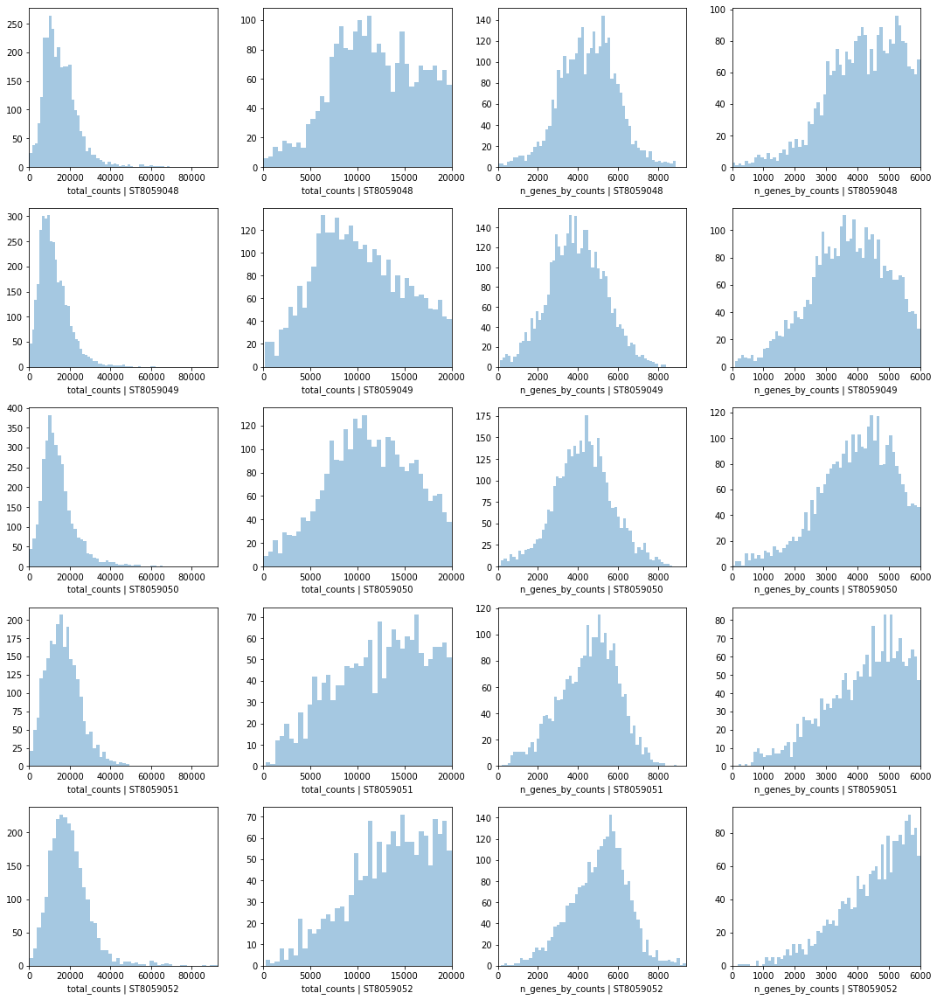

In [8]:
# PLOT QC FOR EACH SAMPLE
fig, axs = plt.subplots(len(slides), 4, figsize=(15, 4*len(slides)-4))
for i, s in enumerate(adata.obs['sample'].unique()):
    #fig.suptitle('Covariates for filtering')

    slide = select_slide(adata, s)
    sns.distplot(slide.obs['total_counts'],
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel(f'total_counts | {s}')

    sns.distplot(slide.obs['total_counts']\
                 [slide.obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel(f'total_counts | {s}')

    sns.distplot(slide.obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel(f'n_genes_by_counts | {s}')

    sns.distplot(slide.obs['n_genes_by_counts']\
                 [slide.obs['n_genes_by_counts']<6000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel(f'n_genes_by_counts | {s}')

plt.tight_layout()

In [9]:
adata_vis = adata
adata_vis

View of AnnData object with n_obs × n_vars = 14968 × 31040
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-ST8059048', 'mean_counts-ST8059048', 'log1p_mean_counts-ST8059048', 'pct_dropout_by_counts-ST8059048', 'total_counts-ST8059048', 'log1p_total_counts-ST8059048', 'n_cells_by_counts-ST8059049', 'mean_counts-ST8059049', 'log1p_mean_counts-ST8059049', 'pct_dropout_by_counts-ST8059049', 'total_counts-ST8059049', 'log1p_total_counts-ST8059049', 'n_cells_by_counts-ST8059050', 'mean_counts-ST8059050', 'log1p_mean_counts-ST8059050', 'pct_dropout_by_counts-ST8059050', 'total_counts-ST8059050', 'log1p_total_counts-ST8059050', 'n_cells_by_counts-ST8059051', 'mean_counts-ST8059051', 'log1p_mean_coun

In [10]:
def merge_gene_symbol_duplicates (adata, symbol_column='gene_id'):
    var = adata.var
    original_len = len(var)
    X = adata.X.todense()
    temp_df = pd.DataFrame(X).transpose()

    # establish gene names without variants
    gene_no_alt = [x.split('.')[0].upper() for x in var[symbol_column]]

    # add the no alternaticve splicing variants into teh var dataframe and make it the index
    var['Gene_no_alt'] = gene_no_alt
    var.index = gene_no_alt
    print(temp_df)
    temp_df[symbol_column] = gene_no_alt # add the no splicing variant column into the expression dataframe
    temp_df = temp_df.groupby(symbol_column).sum().transpose()
    var = var.drop_duplicates(subset=['Gene_no_alt'])
    var = var.reindex(temp_df.columns) # make sure that the grouping by some miracle did not rearrange the gene positions
    new_len = len(var)
    adata.uns['merged'] = True
    ad_merge = ad.AnnData(X = temp_df.iloc[:, :].to_numpy(),
                                   var = var,
                                   obs = adata.obs,
                                   obsm = adata.obsm,
                                   uns = adata.uns)
    print(f'Scaled from {original_len} genes incl. alternative splicing to {new_len} genes without alternative splicing variants')

    return ad_merge

In [12]:
adata_vis = merge_gene_symbol_duplicates(adata_vis, symbol_column='SYMBOL')

       0      1      2      3      4      5      6      7      8      9      \
0        2.0    0.0    0.0    0.0    1.0    0.0    1.0    0.0    0.0    1.0   
1        0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
2        0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
3        0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
4        0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
...      ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
31035    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
31036    2.0    0.0    1.0    0.0    0.0    0.0    1.0    1.0    1.0    2.0   
31037    0.0    2.0    1.0    0.0    0.0    2.0    0.0    0.0    0.0    0.0   
31038    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
31039    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   

       ...  14958  14959  14960  14961  14962  1496

In [9]:
st_pickle = f'{ref_run_name}adata_vis_{pickle_id}.pickle'
st_pickle

'./results/L5_04102022_descr/reference_signatures/adata_vis_ST3_CN56.pickle'

In [11]:
print(os.getcwd())

if os.path.isfile(st_pickle):
    print('loading saved dataset')
    with open(st_pickle, 'rb') as f:
        adata_vis = pickle.load(f)
else:
    for sample in samples:
        print(sample)
        adata = STLoader(st_path, sample)
        adata.add_image(image_path)
        print('adding image')
        adata.correct_feature_position(image_path)
        adata = adata.anndata
        sample_list.append(adata)
        
    adata_vis = st_concat_anndata(sample_list, samples)

    adata_vis = merge_gene_symbol_duplicates(adata_vis.anndata, symbol_column='gene_id')
    
    with open(st_pickle, 'wb') as f:
        pickle.dump(adata_vis, f)

/media/Dropbox/MNM projects/Spatial transcriptomics project/Data analysis/Complete_ST_pipeline/bin/cell2loc
ST3_D1
dataset loaded
adding image
CN56_E1
dataset loaded
adding image
ST3_C2
dataset loaded
adding image
ST3_D2
dataset loaded
adding image
ST3_E1
dataset loaded
adding image
ST3_E2
dataset loaded
adding image
CN56_E2
dataset loaded
adding image
CN56_C2
dataset loaded
adding image
CN56_D2
dataset loaded
adding image
<class 'anndata._core.anndata.AnnData'>


/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


Scaled from 7907 genes incl. alternative splicing to 7881 genes without alternative splicing variants


/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overlo

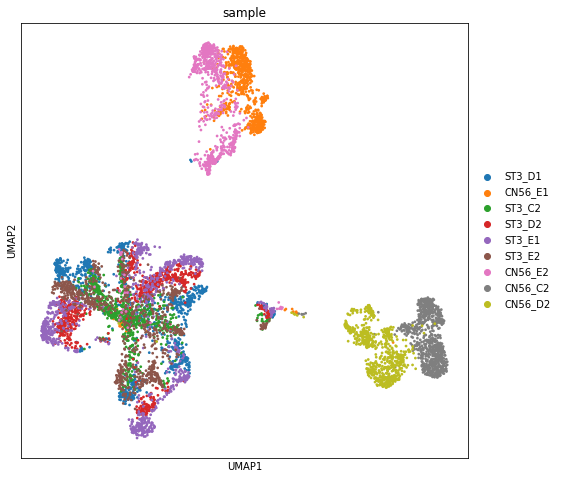

In [47]:
adata_vis_plt = adata_vis.copy()
adata_vis_plt = adata_vis_plt[adata_vis_plt.obs.slide.isin(['CN56', 'ST3']), :]

sc.pp.normalize_total(adata_vis_plt, inplace=True)

# Log-transform (log(data + 1))
sc.pp.log1p(adata_vis_plt)

# Find highly variable genes within each sample
adata_vis_plt.var['highly_variable'] = False
for s in adata_vis_plt.obs['sample'].unique():

    adata_vis_plt_1 = adata_vis_plt[adata_vis_plt.obs['sample'].isin([s]), :]
    sc.pp.highly_variable_genes(adata_vis_plt_1, min_mean=0.0125, max_mean=5, min_disp=0.5, 
                                n_top_genes=1000, flavor='seurat')

    hvg_list = list(adata_vis_plt_1.var_names[adata_vis_plt_1.var['highly_variable']])
    adata_vis_plt.var.loc[hvg_list, 'highly_variable'] = True

# Scale the data ( (data - mean) / sd )
sc.pp.scale(adata_vis_plt, max_value=10)
# PCA, KNN construction, UMAP
sc.tl.pca(adata_vis_plt, svd_solver='arpack', n_comps=40, use_highly_variable=True)
sc.pp.neighbors(adata_vis_plt, n_neighbors = 20, n_pcs = 40, metric='cosine')
sc.tl.umap(adata_vis_plt, min_dist = 0.3, spread = 1)

with mpl.rc_context({'figure.figsize': [8, 8],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata_vis_plt, color=['sample'], size=30,
               color_map = 'RdPu', ncols = 1, #legend_loc='on data',
               legend_fontsize=10)

In [176]:
#test_scanorama
sample_list=[]
for sample in samples:
    
    print(sample)
    adata = STLoader(st_path, sample)
    adata.add_image(image_path)
    print('adding image')
    adata.correct_feature_position(image_path)
    adata = adata.anndata
    sample_list.append(adata)

ST3_D1
dataset loaded
adding image
CN56_E1
dataset loaded
adding image
ST3_C2
dataset loaded
adding image
ST3_D2
dataset loaded
adding image
ST3_E1
dataset loaded
adding image
ST3_E2
dataset loaded
adding image
CN56_E2
dataset loaded
adding image
CN56_C2
dataset loaded
adding image
CN56_D2
dataset loaded
adding image


In [177]:
for idx in range(len(sample_list)):
    sc.pp.calculate_qc_metrics(sample_list[idx], inplace=True)

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


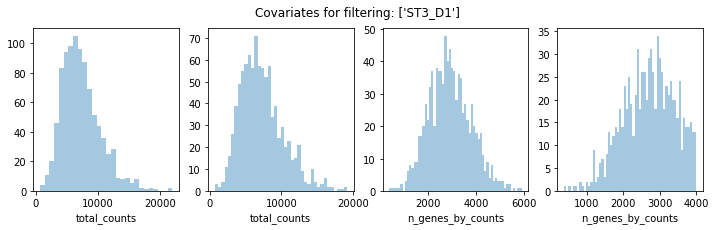

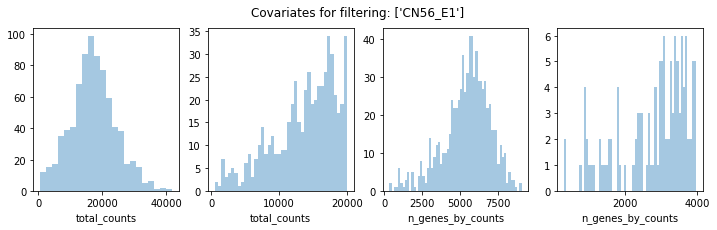

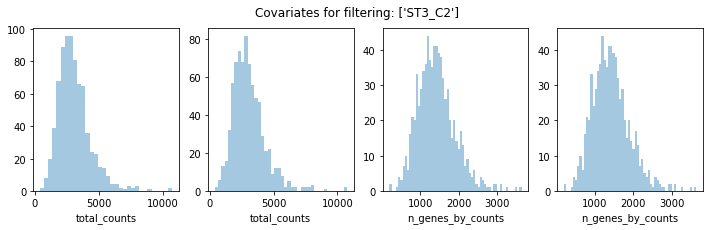

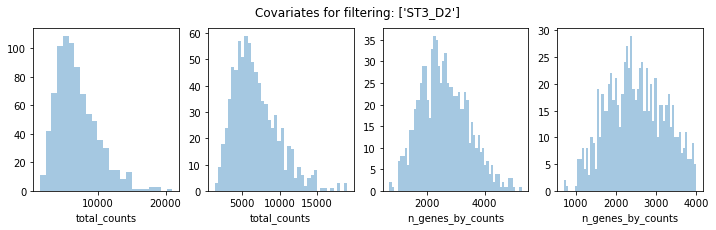

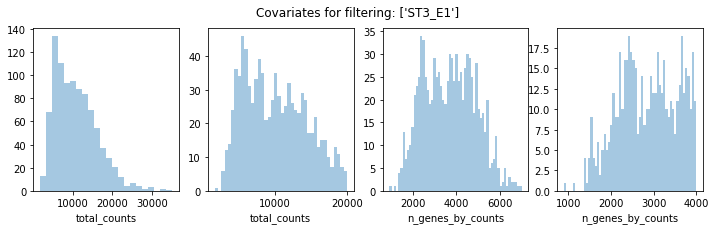

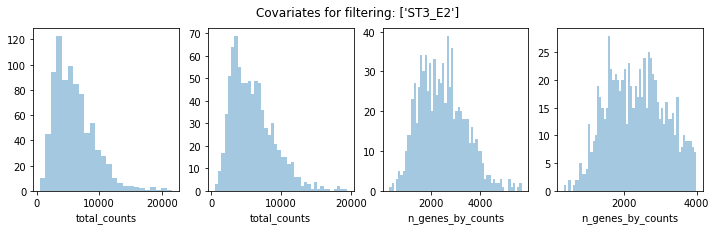

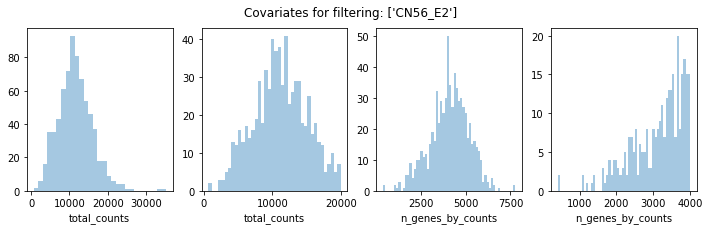

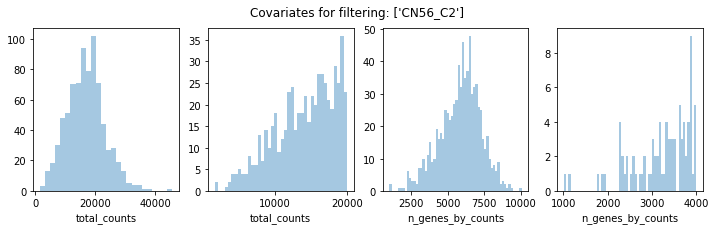

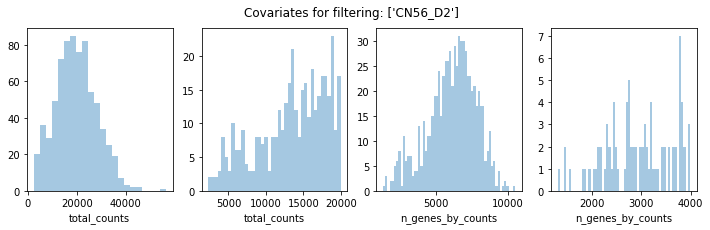

In [135]:
for idx, adata in enumerate(sample_list):
    name = adata.obs['sample'].unique()
    fig, axs = plt.subplots(1, 4, figsize=(12, 3))
    fig.suptitle(f"Covariates for filtering: {name}")

    sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
    sns.distplot(
        adata.obs["total_counts"][adata.obs["total_counts"] < 20000],
        kde=False,
        bins=40,
        ax=axs[1],
    )
    sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
    sns.distplot(
        adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
        kde=False,
        bins=60,
        ax=axs[3],
    )

In [178]:
for adata in sample_list:
    adata.raw = adata.copy()
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=3000, inplace=True)

In [183]:
sample_list[0].raw.X.shape


(944, 12219)

In [138]:
adatas_cor = scanorama.correct_scanpy(sample_list, return_dimred=True)

Found 7907 genes among all datasets
[[0.         0.00769231 0.78525226 0.32360097 0.22043011 0.57449344
  0.04500703 0.         0.        ]
 [0.         0.         0.02199224 0.         0.         0.00128205
  0.42053446 0.23839398 0.16528926]
 [0.         0.         0.         0.3622251  0.05174644 0.81630013
  0.03363519 0.         0.        ]
 [0.         0.         0.         0.         0.79927007 0.32116788
  0.00281294 0.         0.        ]
 [0.         0.         0.         0.         0.         0.22169249
  0.10322581 0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.17520858 0.02622169 0.02026222]
 [0.         0.         0.         0.         0.         0.
  0.         0.03375527 0.11392405]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.52572146]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]]
Processing datasets (2, 5)
Processing datasets (3, 4)
Proce

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/scanorama/scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(datasets[i])
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/scanorama/scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(datasets[i])
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/scanorama/scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dty

In [163]:
adata_spatial = sc.concat(
    sample_list,
    label="sample_id",
    uns_merge="unique",
    keys=None,
    index_unique="-",
)
adata_spatial.obs

,feature,array_row,array_col,in_tissue,sample,slide,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,sample_id
X5.04_14.03-ST3_D1-0,X5.04_14.03,5.04,14.03,1,ST3_D1,ST3,2700,7.901377,6231.0,8.737453,31.391430,36.575189,43.524314,57.486760,0
X5.02_10.88-ST3_D1-0,X5.02_10.88,5.02,10.88,1,ST3_D1,ST3,4425,8.395252,12857.0,9.461721,24.523606,30.224780,37.473750,50.501672,0
X16.09_13.86-ST3_D1-0,X16.09_13.86,16.09,13.86,1,ST3_D1,ST3,3884,8.264878,11068.0,9.311904,30.050596,35.272859,42.175641,55.168052,0
X8.01_14.93-ST3_D1-0,X8.01_14.93,8.01,14.93,1,ST3_D1,ST3,2162,7.679251,4754.0,8.466952,36.748002,41.859487,48.695835,62.494741,0
X10.91_24.05-ST3_D1-0,X10.91_24.05,10.91,24.05,1,ST3_D1,ST3,3010,8.010028,7450.0,8.916103,34.268456,39.100671,45.583893,58.429530,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
X4.89_22.95-CN56_D2-8,X4.89_22.95,4.89,22.95,1,CN56_D2,CN56,7080,8.865170,22475.0,10.020204,18.620690,23.101224,29.125695,40.694105,8
X10.84_24.81-CN56_D2-8,X10.84_24.81,10.84,24.81,1,CN56_D2,CN56,8297,9.023770,32497.0,10.388934,16.579992,21.485060,27.833338,39.806751,8
X8.87_14.85-CN56_D2-8,X8.87_14.85,8.87,14.85,1,CN56_D2,CN56,6746,8.816853,21139.0,9.958922,18.591229,23.241402,29.679739,41.520413,8
X20.05_19.96-CN56_D2-8,X20.05_19.96,20.05,19.96,1,CN56_D2,CN56,6078,8.712595,17999.0,9.798127,20.767820,25.601422,32.118451,44.308017,8


In [154]:
sc.pp.neighbors(adata_spatial, use_rep="X_scanorama")
sc.tl.pca(adata_spatial)
sc.tl.umap(adata_spatial)
sc.tl.leiden(adata_spatial, key_added="clusters")

In [164]:
sc.pl.umap(
    adata_spatial, color=["clusters", "sample", 'slide'], palette=sc.pl.palettes.default_20
)

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [170]:
sc.tl.pca(adata_spatial)
sc.external.pp.harmony_integrate(adata_spatial, key='sample')

2022-10-05 11:45:51,391 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2022-10-05 11:45:52,874 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2022-10-05 11:45:54,368 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2022-10-05 11:45:55,869 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2022-10-05 11:45:57,227 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2022-10-05 11:45:58,867 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2022-10-05 11:46:00,566 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2022-10-05 11:46:02,260 - harmonypy - INFO - Iteration 8 of 10
INFO:harmonypy:Iteration 8 of 10
2022-10-05 11:46:03,670 - harmonypy - INFO - Iteration 9 of 10
INFO:harmonypy:Iteration 9 of 10
2022-10-05 11:46:04,646 - harmonypy - INFO - Converged after 9 iterations
INFO:harmonypy:Converged after 9 iterations


In [171]:
pd.DataFrame(adata_spatial.obsm['X_pca_harmony']).shape

(7322, 50)

In [172]:
sc.pp.neighbors(adata_spatial, use_rep="X_pca_harmony")
sc.tl.umap(adata_spatial)
sc.tl.leiden(adata_spatial, key_added="clusters")

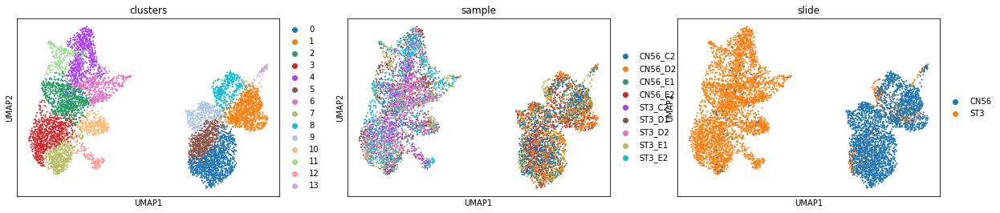

In [173]:
sc.pl.umap(
    adata_spatial, color=["clusters", "sample", 'slide'], palette=sc.pl.palettes.default_20
)

In [75]:
clusters_colors = dict(
    zip([str(i) for i in range(18)], adata_spatial.uns["clusters_colors"])
)

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


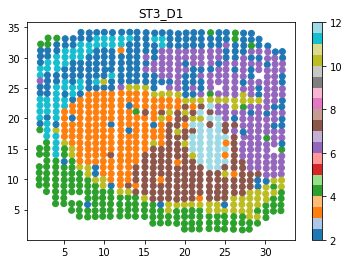

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


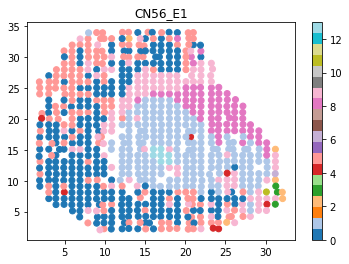

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


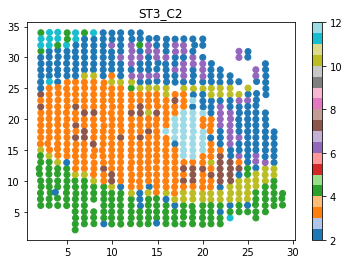

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


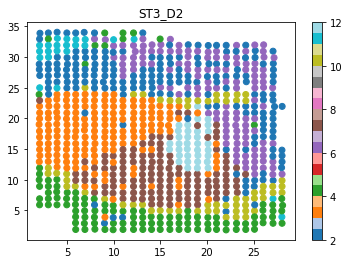

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


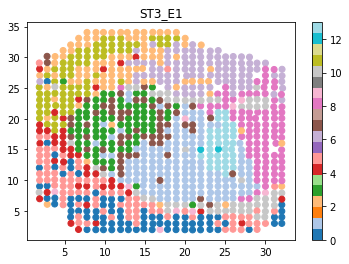

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


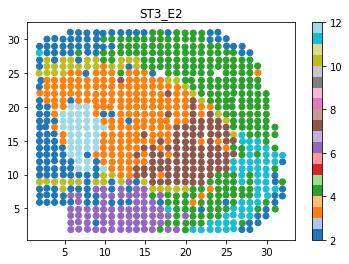

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


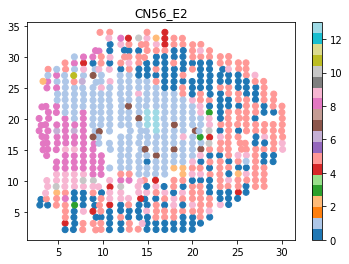

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


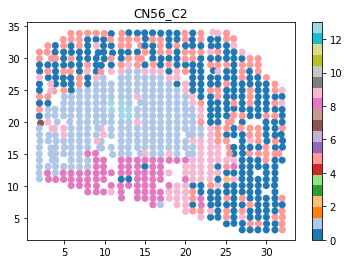

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


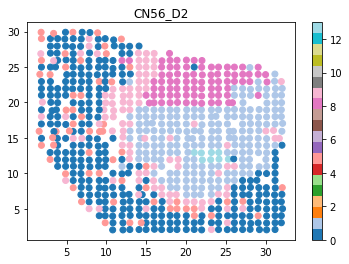

In [175]:
#fig, axs = plt.subplots(6, 2, figsize=(15, 10))
for sample in samples:
    slide = select_slide(adata_spatial, s=sample)
    plt.scatter(x=slide.obs['array_row'], y=slide.obs['array_col'], c=slide.obs['clusters'].astype(int).to_list(),
               cmap='tab20')
    plt.title(sample)
    plt.colorbar()
    plt.show()



In [12]:
def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

In [13]:
adata_vis = adata_vis.anndata

AttributeError: 'AnnData' object has no attribute 'anndata'

In [14]:
adata_vis, adata_vis.obs, adata_vis.var

(AnnData object with n_obs × n_vars = 7322 × 7881
     obs: 'feature', 'array_row', 'array_col', 'in_tissue', 'sample', 'slide', 'median_gene_feature', 'median_transcript_feature'
     var: 'gene_id', 'Gene_no_alt'
     uns: 'merged', 'spatial'
     obsm: 'spatial',
                            feature  array_row  array_col  in_tissue   sample  \
 X5.04_14.03-ST3_D1     X5.04_14.03       5.04      14.03          1   ST3_D1   
 X5.02_10.88-ST3_D1     X5.02_10.88       5.02      10.88          1   ST3_D1   
 X16.09_13.86-ST3_D1   X16.09_13.86      16.09      13.86          1   ST3_D1   
 X8.01_14.93-ST3_D1     X8.01_14.93       8.01      14.93          1   ST3_D1   
 X10.91_24.05-ST3_D1   X10.91_24.05      10.91      24.05          1   ST3_D1   
 ...                            ...        ...        ...        ...      ...   
 X4.89_22.95-CN56_D2    X4.89_22.95       4.89      22.95          1  CN56_D2   
 X10.84_24.81-CN56_D2  X10.84_24.81      10.84      24.81          1  CN56_D2   
 X8.

In [ ]:
# #run if you want to select species (only works with teh ensembl file)
# adata_vis.select_species('ENSG')
# adata_vis.anndata

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


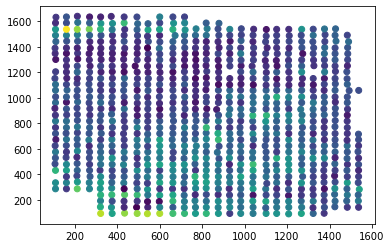

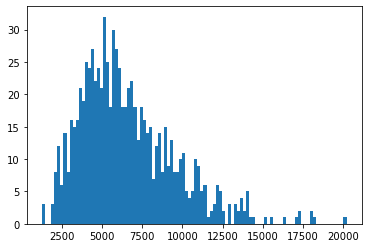

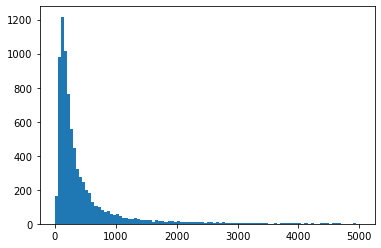

In [15]:
sample = samples[3]
c = np.sum(adata_vis[adata_vis.obs['sample'] == sample, :].X, axis=1)
adata_vis.obsm['spatial']
x = select_slide(adata_vis, sample)
plt.scatter(x.obsm['spatial'][:, 0], x.obsm['spatial'][:, 1], c=c)
plt.show()
plt.hist(x.X.sum(axis=1).flatten(), bins=100)
plt.show()
plt.clf()
plt.hist(x.X.sum(axis=0).flatten(), range=[0, 5000], bins=100)
plt.show()

In [16]:
## load single cell data 
sc_file = '/media/Dropbox/MNM projects/Spatial transcriptomics project/Data analysis/Complete_ST_pipeline/data/stereoscope_reference/single_cell_data/curated/Linnarsson_VM-STR-Ctx-selection_23082021/Linnarsson_VM-STR-Ctx-selection_23082021.pkl'
    
if '.pkl' not in str(sc_file):
    print('new anndata')
    sc_obs = pd.read_csv(sc_path + [file for file in os.listdir(sc_path) if 'mta_data' in file][0], sep='\t', 
                     header=0, 
                     index_col=False)
    sc_obs.index = sc_path.split('/')[-2] + '_' + sc_obs['cell']
    
    sc_cnt = pd.read_csv(sc_path + [file for file in os.listdir(sc_path) if 'cnt_data' in file][0], sep='\t',
                    index_col=0,
                    header=0)
    
    sc_var = pd.DataFrame(sc_cnt.columns)
    sc_var.columns = ['SYMBOL']
    sc_var.index = sc_var['SYMBOL']
    
    sc_adata = anndata.AnnData(obs=sc_obs, var=sc_var, X = sc_cnt.iloc[:,:].to_numpy())

    outfile = open(sc_path + filename,'wb')
    pickle.dump(sc_adata, outfile)
    outfile.close()
else:
    print('found a pickle!')
    with open(sc_file,'rb') as infile:
        sc_adata = pickle.load(infile)

found a pickle!


/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


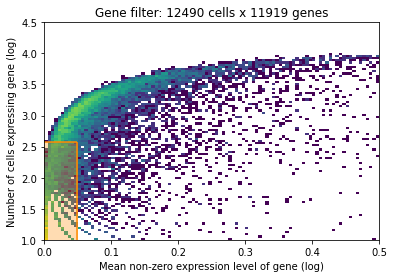

In [17]:
#adata_vis.var['SYMBOL'] = adata_vis.var_names
#adata_vis.var.set_index('gene_ids', drop=True, inplace=True)

# find mitochondria-encoded (MT) genes
adata_vis.var['MT_gene'] = [gene.startswith('MT-') for gene in adata_vis.var['gene_id']]

# remove MT genes for spatial mapping (keeping their counts in the object)
adata_vis.obsm['MT'] = adata_vis[:, adata_vis.var['MT_gene'].values].X.toarray()
adata_vis = adata_vis[:, ~adata_vis.var['MT_gene'].values]

# Read data
adata_ref = sc_adata.copy()

from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)

# filter the object
adata_ref = adata_ref[:, selected].copy()

In [21]:
adata_ref.obs['ChipID'] = [x.split('_')[0] for  x in adata_ref.obs['cell']]
adata_ref.obs

,cell,bio_celltype,_indices,ChipID
cell,,,,
Linnarsson_VM-STR-Ctx-selection_23082021_10X01_1_AAACCGTGGTGAGG-1,10X01_1_AAACCGTGGTGAGG-1,"Basket and bistratified cells, cortex/hippocam...",0,10X01
Linnarsson_VM-STR-Ctx-selection_23082021_10X01_1_AAATCCCTGCGAGA-1,10X01_1_AAATCCCTGCGAGA-1,Subventricular zone radial glia-like cells,1,10X01
Linnarsson_VM-STR-Ctx-selection_23082021_10X01_1_AAATCCCTGTGCTA-1,10X01_1_AAATCCCTGTGCTA-1,Cortical projection neurons; mouse,2,10X01
Linnarsson_VM-STR-Ctx-selection_23082021_10X01_1_AAATGGGAGCATAC-1,10X01_1_AAATGGGAGCATAC-1,Immune cells; mouse,3,10X01
Linnarsson_VM-STR-Ctx-selection_23082021_10X01_1_AAATTCGAAGATCC-1,10X01_1_AAATTCGAAGATCC-1,"Telencephalon astrocytes, fibrous; mouse",4,10X01
...,...,...,...,...
Linnarsson_VM-STR-Ctx-selection_23082021_10X57_7_TTGTACCTTCGC-,10X57_7_TTGTACCTTCGC-,"Non-telencephalon astrocytes, fibrous; mouse",12485,10X57
Linnarsson_VM-STR-Ctx-selection_23082021_10X86_3:CATTAGCTCCGTTC-1,10X86_3:CATTAGCTCCGTTC-1,Cholinergic interneurons; mouse,12486,10X86
Linnarsson_VM-STR-Ctx-selection_23082021_10X86_3:CTAGGATGCCAATG-1,10X86_3:CTAGGATGCCAATG-1,Cholinergic interneurons; mouse,12487,10X86


In [23]:
# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=adata_ref,
                        # 10X reaction / sample / batch
                        batch_key='ChipID',
                        # cell type, covariate used for constructing signatures
                        labels_key='bio_celltype',
                        #categorical_covariate_keys=['PCRCycles']                          
                       )
# create the regression model
from cell2location.models import RegressionModel
mod = RegressionModel(adata_ref)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/scvi/data/_utils.py:168: UserWarning: Category 31 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(


Anndata setup with scvi-tools version 0.17.3.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'ChipID',
│   'labels_key': 'bio_celltype',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│          n_vars          │ 11919 │
│         n_cells          │ 12490 │
│         n_batch          │  32   │
│         n_labels         │  29   │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
│    ind_x     │   adata.obs['_indices']   │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['ChipID'] │   10X01    │          0          │
│                     │   10X02    │          1          │
│                     │   10X04    │          2          │
│                     │   10X05    │          3          │
│                     │   10X06    │          4          │
│                     │   10X07    │          5          │
│                     │   10X11    │          6          │
│                     │   10X19    │          7          │
│                     │   10X20    │          8          │
│                     │   10X22    │          9          │
│                     │   10X24    │         10          │
│                     │   10X26    │         11          │
│                     │   10X28    │         12          │
│                     │   10X33    │         13          │
│                     │   10X34    │         14          │
│                     │   10X35    │         15          │
│                     │   10X36    │         16          │
│                     │   10X38    │         17          │
│                     │   10X43    │         18          │
│                     │   10X46    │         19          │
│                     │   10X48    │         20          │
│                     │   10X49    │         21          │
│                     │   10X50    │         22          │
│                     │   10X51    │         23          │
│                     │   10X52    │         24          │
│                     │   10X53    │         25          │
│                     │   10X54    │         26          │
│                     │   10X55    │         27          │
│                     │   10X56    │         28          │
│                     │   10X57    │         29          │
│                     │   10X86    │         30          │
│                     │   10X87    │         31          │
└─────────────────────┴────────────┴─────────────────────┘

                                    labels State Registry                                    
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃ Source Locati ┃                            Categories                            ┃ scvi-t ┃
┡━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ adata.obs['bi │              Axo-axonic, cortex/hippocampus (decoy)              │   0    │
│               │    Basket and bistratified cells, cortex/hippocampus (decoy)     │   1    │
│               │ CGE-derived neurogliaform cells Cxcl14+, cortex/hippocampus (dec │   2    │
│               │   CGE-derived neurogliaform cells, cortex/hippocampus (decoy)    │   3    │
│               │                 Cholinergic interneurons; mouse                  │   4    │
│               │        Cholinergic neurons, midbrain red nucleus (decoy)         │   5    │
│               │                Cortical projection neurons; mouse                │   6    │
│               │                  D1 Medium Spiny Neurons; mouse                  │   7    │
│               │                  D2 Medium Spiny Neurons; mouse                  │   8    │
│               │                   Dopaminergic neurons; mouse                    │   9    │
│               │     Hippocamposeptal projection, cortex/hippocampus (decoy)      │   10   │
│               │                       Immune cells; mouse                        │   11   │
│               │               Inhibitory neurons, midbrain (decoy)               │   12   │
│               │            Inhibitory neurons, septal nucleus (decoy)            │   13   │
│               │  Interneuron-selective interneurons, cortex/hippocampus (decoy)  │   14   │
│               │ Ivy and MGE-derived neurogliaform cells, cortex/hippocampus (dec │   15   │
│               │          Neuronal intermidate progenitor cells (decoy)           │   16   │
│               │     Non-border Cck interneurons, cortex/hippocampus (decoy)      │   17   │
│               │           Non-telencephalon astrocytes, fibrous; mouse           │   18   │
│               │        Non-telencephalon astrocytes, protoplasmic; mouse         │   19   │
│               │                     Oligodendrocytes; mouse                      │   20   │
│               │              Patch D1/D2 neurons, striatum (decoy)               │   21   │
│               │     R-LM border Cck interneurons, cortex/hippocampus (decoy)     │   22   │
│               │ Sleep-active, long-range projection interneurons, cortex/hippoca │   23   │
│               │            Subventricular zone radial glia-like cells            │   24   │
│               │             Telencephalon astrocytes, fibrous; mouse             │   25   │
│               │          Telencephalon astrocytes, protoplasmic; mouse           │   26   │
│               │               Vascular leptomeningeal cells; mouse               │   27   │
│               │                         Vascular; mouse                          │   28   │
└───────────────┴──────────────────────────────────────────────────────────────────┴────────┘

In [24]:
mod.train(max_epochs=450, use_gpu=True)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:131: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:1933: PossibleUserWarning: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 1/450:   0%|                                                | 0/450 [00:00<?, ?it/s]

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/torch/distributions/gamma.py:71: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is /home/lcadmin/.cache/torch/kernels. This warning will appear only once per process. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646756402876/work/aten/src/ATen/native/cuda/jit_utils.cpp:860.)
  self.rate * value - torch.lgamma(self.concentration))


Epoch 450/450: 100%|███████| 450/450 [53:25<00:00,  7.12s/it, v_num=1, elbo_train=6.62e+7]


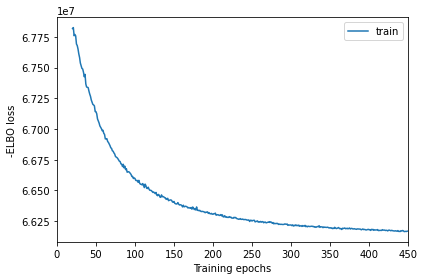

In [25]:
mod.plot_history(20)

In [26]:
mod.save(f"{ref_run_name}", overwrite=True)

In [27]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500, 'use_gpu': True}
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}sc.h5ad"
adata_ref.write_h5ad(adata_file)
adata_file

Sampling global variables, sample: 100%|████████████████| 999/999 [00:16<00:00, 61.36it/s]


'./results/L5_04102022_descr/reference_signatures/sc.h5ad'

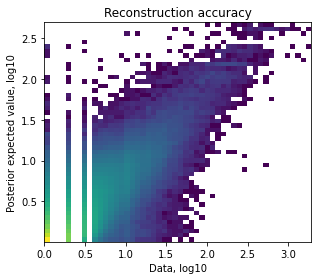

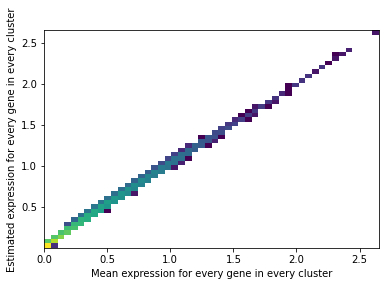

In [28]:
mod.plot_QC()

In [25]:
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(f"{ref_run_name}", adata_ref)

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = './results/visium_test_L5_04102022_descr/reference_signatures//sc.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [29]:
adata_ref

AnnData object with n_obs × n_vars = 12490 × 11919
    obs: 'cell', 'bio_celltype', '_indices', 'ChipID', '_scvi_batch', '_scvi_labels'
    var: 'SYMBOL', 'n_cells', 'nonz_mean'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'

In [30]:
pickle.dump(adata_ref, open(adata_file + '.pkl', 'wb'))

In [13]:
adata_ref = pickle.load(open('/media/Dropbox/MNM projects/Spatial transcriptomics project/Data analysis/Complete_ST_pipeline/bin/cell2loc/results/L5_04102022_descr/reference_signatures/sc.h5ad.pkl', 'rb'))

In [14]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.loc[['TH', 'SLC6A3', 'COL1A1', 'PENK', 'PDYN', 'DRD1']].transpose()

SYMBOL,TH,SLC6A3,COL1A1,PENK,PDYN,DRD1
"Axo-axonic, cortex/hippocampus (decoy)",0.131535,0.002392,0.003013,0.096172,0.014319,0.045872
"Basket and bistratified cells, cortex/hippocampus (decoy)",0.377882,0.002237,0.012447,0.088190,0.005041,0.066727
"CGE-derived neurogliaform cells Cxcl14+, cortex/hippocampus (decoy)",0.002673,0.002805,0.004505,0.048711,0.003888,0.047441
"CGE-derived neurogliaform cells, cortex/hippocampus (decoy)",0.003350,0.002270,0.002179,0.007605,0.005766,0.031775
Cholinergic interneurons; mouse,0.429494,0.074587,0.004459,0.181179,0.048479,0.020076
"Cholinergic neurons, midbrain red nucleus (decoy)",0.010228,0.011835,0.010585,0.011401,0.012101,0.011423
Cortical projection neurons; mouse,0.002345,0.003206,0.002146,0.121400,0.023731,0.076035
D1 Medium Spiny Neurons; mouse,0.003844,0.002255,0.002972,0.262147,0.963762,1.889589
D2 Medium Spiny Neurons; mouse,0.002406,0.002619,0.003482,12.751055,0.011589,0.030306
Dopaminergic neurons; mouse,5.309416,14.181613,0.008833,0.020257,0.009714,0.008393


In [15]:
inf_aver

,"Axo-axonic, cortex/hippocampus (decoy)","Basket and bistratified cells, cortex/hippocampus (decoy)","CGE-derived neurogliaform cells Cxcl14+, cortex/hippocampus (decoy)","CGE-derived neurogliaform cells, cortex/hippocampus (decoy)",Cholinergic interneurons; mouse,"Cholinergic neurons, midbrain red nucleus (decoy)",Cortical projection neurons; mouse,D1 Medium Spiny Neurons; mouse,D2 Medium Spiny Neurons; mouse,Dopaminergic neurons; mouse,...,"Non-telencephalon astrocytes, protoplasmic; mouse",Oligodendrocytes; mouse,"Patch D1/D2 neurons, striatum (decoy)","R-LM border Cck interneurons, cortex/hippocampus (decoy)","Sleep-active, long-range projection interneurons, cortex/hippocampus (decoy)",Subventricular zone radial glia-like cells,"Telencephalon astrocytes, fibrous; mouse","Telencephalon astrocytes, protoplasmic; mouse",Vascular leptomeningeal cells; mouse,Vascular; mouse
SYMBOL,,,,,,,,,,,,,,,,,,,,,
0610007P14RIK,0.533148,0.426211,0.550799,0.595887,0.680919,0.289998,0.745605,0.422301,0.396788,0.412089,...,0.195222,1.203312,0.499862,0.651050,0.534644,0.426085,0.256614,0.353146,0.246770,0.139654
0610009B22RIK,0.499448,0.463448,0.413136,0.471940,1.400057,0.651671,0.542801,0.342446,0.260326,0.544267,...,0.172212,0.429858,0.258843,0.872218,0.642086,0.467003,0.169575,0.282193,0.390448,0.218866
0610009L18RIK,0.202043,0.205608,0.072741,0.106464,0.274379,0.103860,0.176837,0.179770,0.102208,0.140401,...,0.049650,0.029799,0.109836,0.184322,0.118265,0.126831,0.136961,0.080755,0.044356,0.026907
0610009O20RIK,0.114696,0.118466,0.144381,0.082636,0.196874,0.065837,0.148999,0.087566,0.057420,0.120501,...,0.073342,0.096658,0.041341,0.139822,0.054716,0.072367,0.125468,0.102304,0.129462,0.168006
0610010F05RIK,0.158351,0.170709,0.090358,0.075480,0.730344,0.360012,0.234966,0.089148,0.104690,0.193813,...,0.003481,0.103099,0.076777,0.217549,0.161476,0.018309,0.007791,0.006416,0.034213,0.035133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDC,0.108727,0.059610,0.016542,0.045406,0.154918,0.069077,0.085622,0.027769,0.044555,0.087172,...,0.015700,0.050211,0.036620,0.086122,0.065817,0.023237,0.012130,0.028027,0.052312,0.024917
ZYG11B,0.642115,0.688203,0.354150,0.369675,2.112162,1.121065,0.703960,0.356702,0.258241,1.252238,...,0.093127,0.141022,0.347315,1.004499,0.527454,0.048300,0.096160,0.080775,0.143605,0.098368
ZYX,0.144737,0.212918,0.057491,0.063046,0.166699,0.206373,0.149283,0.015340,0.027004,0.028792,...,0.010824,0.195312,0.014203,0.132549,0.122834,0.010513,0.022974,0.012381,0.131277,0.189577


In [44]:
# export estimated expression in each cluster # duplicate to see if the previous run did it any good
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.loc[['TH', 'SLC6A3', 'COL1A1', 'PENK', 'PDYN', 'DRD1']].transpose()

symbol,TH,SLC6A3,COL1A1,PENK,PDYN,DRD1
"Astrocytes, fibrous; mouse",0.002245,0.003974,0.021873,0.003230,0.034808,0.001987
"Astrocytes, protoplasmic; mouse",0.002592,0.002116,0.023921,0.004246,0.004787,0.002008
"Axo-axonic, cortex/hippocampus",0.139791,0.002359,0.003197,0.090125,0.014971,0.041825
"Basket and bistratified cells, cortex/hippocampus",0.415391,0.002065,0.013485,0.092227,0.004742,0.077499
"CGE-derived neurogliaform cells Cxcl14+, cortex/hippocampus",0.002330,0.002356,0.004417,0.048895,0.003551,0.046097
"CGE-derived neurogliaform cells, cortex/hippocampus",0.006855,0.002123,0.001993,0.005507,0.006004,0.026164
"Cholinergic interneurons, telencephalon",0.389882,0.098299,0.004430,0.311305,0.076561,0.042161
"Cholinergic neurons, midbrain red nucleus",0.005601,0.005493,0.005420,0.005580,0.005503,0.005322
"D1 medium spiny neurons, striatum",0.004437,0.002071,0.001922,0.156496,1.024932,1.769847
"D2 medium spiny neurons, striatum",0.003213,0.001932,0.002725,11.112765,0.012630,0.026826


In [16]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac
spot_id,,,,,,,,,,,,,
ST8059048_AAACAAGTATCTCCCA-1,1,50,102,ST8059048,4678,8.450840,14284.0,9.566965,27.457295,32.812938,39.897788,52.856343,0.199314
ST8059048_AAACACCAATAACTGC-1,1,59,19,ST8059048,3549,8.174703,9951.0,9.205529,37.061602,42.337454,49.110642,60.586876,0.277761
ST8059048_AAACAGAGCGACTCCT-1,1,14,94,ST8059048,6779,8.821732,32155.0,10.378354,23.784792,29.830508,37.860364,51.397916,0.151330
ST8059048_AAACAGCTTTCAGAAG-1,1,43,9,ST8059048,3108,8.042056,7935.0,8.979165,32.917454,39.054820,46.389414,59.206049,0.240202
ST8059048_AAACAGGGTCTATATT-1,1,47,13,ST8059048,4515,8.415382,14483.0,9.580800,30.994960,36.415107,43.506180,56.031209,0.220258
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ST8059052_TTGTTCAGTGTGCTAC-1,1,24,64,ST8059052,4021,8.299535,12696.0,9.449121,32.277883,39.421865,47.644928,60.200063,0.109326
ST8059052_TTGTTGTGTGTCAAGA-1,1,31,77,ST8059052,3695,8.215006,10454.0,9.254835,33.862636,38.999426,45.752822,57.910848,0.245361
ST8059052_TTGTTTCACATCCAGG-1,1,58,42,ST8059052,1905,7.552762,5032.0,8.523771,45.926073,51.510334,58.267091,71.184420,0.374801


In [17]:
adata_vis_b = adata_vis.copy()
adata_vis_b

AnnData object with n_obs × n_vars = 14968 × 30902
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-ST8059048', 'mean_counts-ST8059048', 'log1p_mean_counts-ST8059048', 'pct_dropout_by_counts-ST8059048', 'total_counts-ST8059048', 'log1p_total_counts-ST8059048', 'n_cells_by_counts-ST8059049', 'mean_counts-ST8059049', 'log1p_mean_counts-ST8059049', 'pct_dropout_by_counts-ST8059049', 'total_counts-ST8059049', 'log1p_total_counts-ST8059049', 'n_cells_by_counts-ST8059050', 'mean_counts-ST8059050', 'log1p_mean_counts-ST8059050', 'pct_dropout_by_counts-ST8059050', 'total_counts-ST8059050', 'log1p_total_counts-ST8059050', 'n_cells_by_counts-ST8059051', 'mean_counts-ST8059051', 'log1p_mean_counts-ST805

In [18]:
adata_vis = adata_vis[adata_vis.obs['sample'].isin(['ST8059050', 'ST8059051', 'ST8059052']), :]

In [19]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key='sample')

In [20]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=30
    ,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.17.3.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│          n_vars          │ 11626 │
│         n_cells          │ 8482  │
│         n_batch          │   3   │
│         n_labels         │   1   │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
│    ind_x     │   adata.obs['_indices']   │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │ ST8059050  │          0          │
│                     │ ST8059051  │          1          │
│                     │ ST8059052  │          2          │
└─────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:131: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:1933: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 1/30000:   0%|                                            | 0/30000 [00:00<?, ?it/s]

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/torch/distributions/gamma.py:71: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is /home/lcadmin/.cache/torch/kernels. This warning will appear only once per process. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646756402876/work/aten/src/ATen/native/cuda/jit_utils.cpp:860.)
  self.rate * value - torch.lgamma(self.concentration))


Epoch 30000/30000: 100%|█| 30000/30000 [2:32:06<00:00,  3.29it/s, v_num=1, elbo_train=8.72


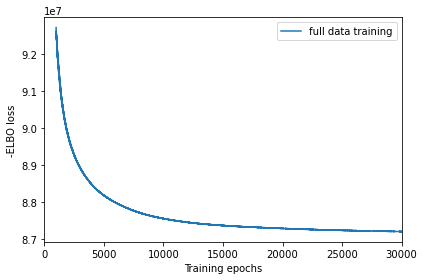

In [21]:
mod.train(max_epochs=30000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1,
          use_gpu=True)

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

In [22]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': True}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

Sampling global variables, sample: 100%|████████████████| 999/999 [00:49<00:00, 20.16it/s]


'./results/visium_test_L5_04102022_descr/cell2location_map//sp.h5ad'

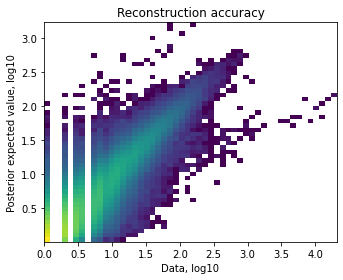

In [23]:
mod.plot_QC()

In [44]:
adata_file = f"{run_name}/sp.h5ad"
adata_vis = sc.read(adata_file)
adata_vis

AnnData object with n_obs × n_vars = 7322 × 6481
    obs: 'feature', 'array_row', 'array_col', 'in_tissue', 'sample', 'slide', 'median_gene_feature', 'median_transcript_feature', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'gene_id', 'Gene_no_alt', 'MT_gene'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'merged', 'mod', 'spatial'
    obsm: 'MT', '_scvi_extra_continuous_covs', 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [45]:
sample=['ST3_C2']
slide = select_slide(adata_vis, sample)

TypeError: unhashable type: 'list'

In [24]:
slide.obs

NameError: name 'slide' is not defined

In [25]:
cell_types = sorted(adata_ref.obs['bio_celltype'].unique().to_list())
# cell_types = [ctype for ctype in cell_types if slide.obs[ctype].max()>2]
print(cell_types)

['Axo-axonic, cortex/hippocampus (decoy)', 'Basket and bistratified cells, cortex/hippocampus (decoy)', 'CGE-derived neurogliaform cells Cxcl14+, cortex/hippocampus (decoy)', 'CGE-derived neurogliaform cells, cortex/hippocampus (decoy)', 'Cholinergic interneurons; mouse', 'Cholinergic neurons, midbrain red nucleus (decoy)', 'Cortical projection neurons; mouse', 'D1 Medium Spiny Neurons; mouse', 'D2 Medium Spiny Neurons; mouse', 'Dopaminergic neurons; mouse', 'Hippocamposeptal projection, cortex/hippocampus (decoy)', 'Immune cells; mouse', 'Inhibitory neurons, midbrain (decoy)', 'Inhibitory neurons, septal nucleus (decoy)', 'Interneuron-selective interneurons, cortex/hippocampus (decoy)', 'Ivy and MGE-derived neurogliaform cells, cortex/hippocampus (decoy)', 'Neuronal intermidate progenitor cells (decoy)', 'Non-border Cck interneurons, cortex/hippocampus (decoy)', 'Non-telencephalon astrocytes, fibrous; mouse', 'Non-telencephalon astrocytes, protoplasmic; mouse', 'Oligodendrocytes; mous

In [ ]:
os.getcwd()

In [ ]:
slide

In [ ]:
os.chdir(start_folder)

In [27]:
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


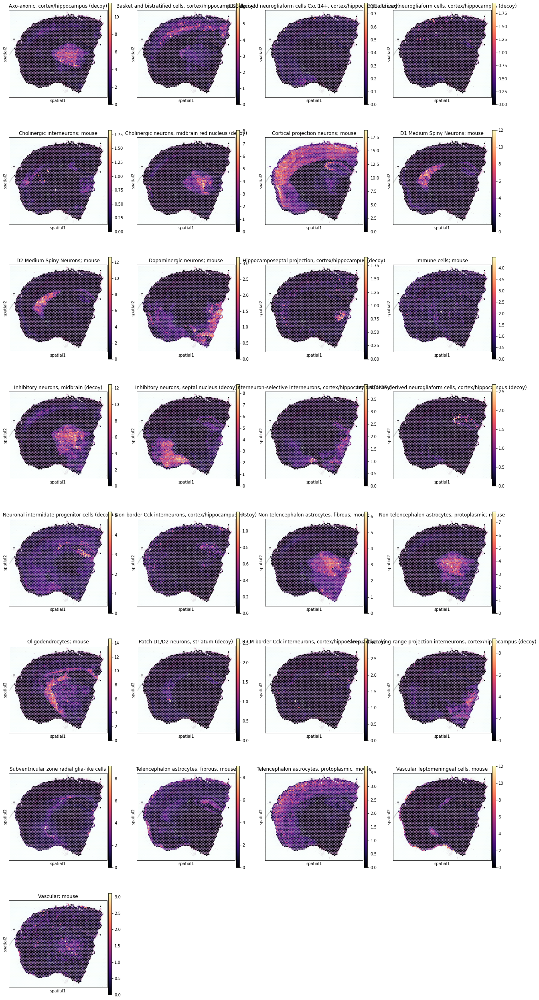

In [28]:
sample='ST8059052'
slide = select_slide(adata_vis, sample)
#     print(f'{sample}_L5_20092022_celltype.pdf')
with mpl.rc_context({'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(slide, cmap='magma',
                  # show first 8 cell types
                  color=cell_types,
                  ncols=4, size=1.3,                   
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0
                 ,# save=f'{sample}_L5_celltype.png'
                 )

/home/lcadmin/miniconda3/envs/ST_pipeline/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


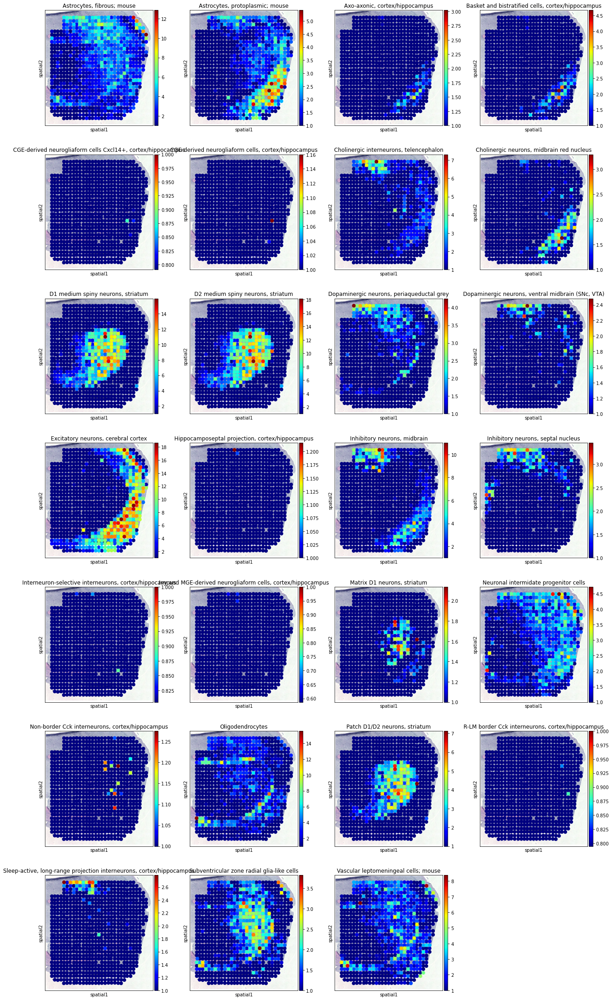

In [54]:
sample='ST3_E2'
slide = select_slide(adata_vis, sample)
with mpl.rc_context({'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(slide, cmap='jet',
                  # show first 8 cell types
                  color=cell_types,
                  ncols=4, size=1.3,                   
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=1
                 )

In [ ]:
out_path = f'{results_folder}std_out/'
os.makedirs(out_path, exist_ok=True)
total_samples = len(adata_vis.obs['sample'].unique())
for idx, sample in enumerate(adata_vis.obs['sample'].unique()):
    print(f'Sample {idx+1}/{total_samples}, {sample}')
    df_out = adata_vis.obs[adata_vis.obs['sample'] == sample][cell_types]
    df_out.index = adata_vis.obs[adata_vis.obs['sample'] == sample].feature
    df_out = df_out.divide(df_out.sum(axis=1), axis=0)
    df_out.to_csv(f'{out_path}W.{sample}_cell_contribution.tsv', sep='\t')

In [ ]:
df_out.sum(axis=1)

In [ ]:
slide.obs[cell_types].div(slide.obs[cell_types].sum(axis=1), axis=0)

In [ ]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['Subventricular zone radial glia-like cells', 
                'Dopaminergic neurons; mouse', 
                'Vascular leptomeningeal cells; mouse']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, sample)

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=17,
        colorbar_position='right'
    )



In [ ]:
# compute KNN using the cell2location output stored in adata.obsm
sc.pp.neighbors(adata_vis, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 15)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1.1)

# add region as categorical variable
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"].astype("category")

In [ ]:
# compute UMAP using KNN graph based on the cell2location output
slide = select_slide(adata_vis, sample)
sc.tl.umap(slide, min_dist = 0.3, spread = 1)

# show regions in UMAP coordinates
with mpl.rc_context({'axes.facecolor':  'white',
                     'figure.figsize': [8, 8]}):
    sc.pl.umap(slide, color=['region_cluster'], size=30,
               color_map = 'RdPu', ncols = 2, legend_loc='on data',
               legend_fontsize=20)
    sc.pl.umap(slide, color=['sample'], size=30,
               color_map = 'RdPu', ncols = 2,
               legend_fontsize=20)

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(slide, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=0.5)

In [ ]:
from cell2location import run_colocation
res_dict, adata_vis = run_colocation(
    adata_vis,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)

In [ ]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()

In [ ]:
# Compute expected expression per cell type
expected_dict = mod.module.model.compute_expected_per_cell_type(
    mod.samples["post_sample_q05"], mod.adata_manager
)

# Add to anndata layers
for i, n in enumerate(mod.factor_names_):
    adata_vis.layers[n] = expected_dict['mu'][i]

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

In [ ]:
adata_vis.var

In [ ]:
# list cell types and genes for plotting
ctypes = ['Vascular leptomeningeal cells; mouse']
genes = ['MBP']

with mpl.rc_context({'axes.facecolor':  'black'}):
    # select one slide
    slide = select_slide(adata_vis, sample)

    from tutorial_utils import plot_genes_per_cell_type
    plot_genes_per_cell_type(slide, genes, ctypes);